In [450]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import loompy as lp

In [451]:
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

In [3]:
# # path to loom file with basic filtering applied (this will be created in the "initial filtering" step below). Optional.
f_loom_path_scenic = "./write/scenic_20210903.loom"

# path to anndata object, which will be updated to store Scanpy results as they are generated below
f_anndata_path = "./write/anndata_20210903.h5ad"

# path to pyscenic output
f_pyscenic_output = "./write/pyscenic_output_20210903.loom"

# loom output, generated from a combination of Scanpy and pyscenic results:
f_final_loom = './write/scenic_integrated-output_20210903.loom'

In [4]:
# import raw count data
adata_raw = sc.read_h5ad('../write/Sanger_Limb_Pcw5.1_to_9.4_and_Upperlimb_lowerlimb_3region_old_new_rawdata_out_doublelet_gene200_10000_cell5_mito0.1_counts20k_out_3_20210828.h5ad')

In [330]:
sc.pl.umap(adata_raw,color=['leiden_R_anno_id'])

/home/bobby/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  fig.canvas.print_figure(bytes_io, **kw)


In [7]:
adata_raw_log1p = sc.pp.normalize_per_cell(adata_raw,counts_per_cell_after=1e4,copy=True)
adata_raw_log1p = sc.pp.log1p(adata_raw_log1p,copy=True)

normalizing by total count per cell
    finished (0:00:04): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


extracting highly variable genes
    finished (0:00:38)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


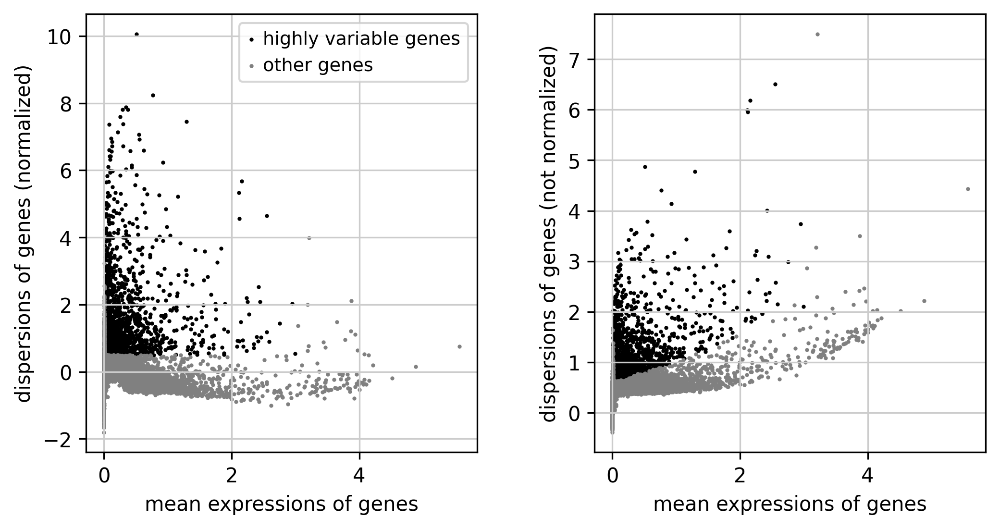

In [8]:
sc.pp.highly_variable_genes(adata_raw_log1p,batch_key='adj_sample')
sc.pl.highly_variable_genes(adata_raw_log1p)

In [9]:
adata_raw_f = adata_raw[:,adata_raw_log1p.var['highly_variable_nbatches']>=3]
adata_raw_f

View of AnnData object with n_obs × n_vars = 114047 × 4075
    obs: 'batch', 'bh_pval', 'is_doublet', 'n_counts', 'n_genes', 'percent_mito', 'region', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stage', 'tissue', 'adj_stage', 'adj_sample', 'S_score', 'G2M_score', 'phase', 'leiden_R', 'leiden_R_anno', 'leiden_R_anno_id_group', 'leiden', 'leiden_R_anno_id'
    var: 'n_cells-0-0', 'n_cells-1-0', 'n_cells-10-0', 'n_cells-11-0', 'n_cells-12-0', 'n_cells-13-0', 'n_cells-14-0', 'n_cells-2-0', 'n_cells-3-0', 'n_cells-4-0', 'n_cells-5-0', 'n_cells-6-0', 'n_cells-7-0', 'n_cells-8-0', 'n_cells-9-0', 'n_cells-0-1', 'n_cells-1-1', 'n_cells-2-1', 'n_cells-3-1', 'n_cells-4-1', 'n_cells-5-1', 'n_cells-0-2', 'n_cells-1-2', 'n_cells-2-2', 'n_cells-3-2', 'n_cells-4-2', 'n_cells-5-2', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'adj_sample_colors', 'adj_stage_colors', 'draw_graph', '

In [24]:
f_loom_path_scenic

'./write/scenic_20210903.loom'

In [25]:
# create basic row and column attributes for the loom file:
row_attrs = {
    "Gene": np.array(adata_raw_f.var_names) ,
}
col_attrs = {
    "CellID": np.array(adata_raw_f.obs_names) ,
    "nGene": np.array( np.sum(adata_raw_f.X.transpose()>0 , axis=0)).flatten() ,
    "nUMI": np.array( np.sum(adata_raw_f.X.transpose() , axis=0)).flatten() ,
}
lp.create( f_loom_path_scenic, adata_raw_f.X.transpose(), row_attrs, col_attrs)

# SCENIC steps
## STEP 1: Gene regulatory network inference, and generation of co-expression modules
### Phase Ia: GRN inference using the GRNBoost2 algorithm
For this step the CLI version of SCENIC is used. This step can be deployed on an High Performance Computing system. We use the counts matrix (without log transformation or further processing) from the loom file we wrote earlier. Output: List of adjacencies between a TF and its targets stored in `ADJACENCIES_FNAME`.

## arboreto_with_multiprocessing.py scenic_20210903.loom /data/zhangbao/work/SCENIC/resources/human/human_tfs.txt --output adj.tsv --num_workers 20

In [29]:
RESOURCES_FOLDER="/data/zhangbao/work/SCENIC/resources/human/"
DATABASE_FOLDER = "/data/zhangbao/work/SCENIC/databases/human/"
#SCHEDULER="123.122.8.24:8786"
#DATABASES_GLOB = os.path.join(DATABASE_FOLDER, "hg19-*.feather")
#MOTIF_ANNOTATIONS_FNAME = os.path.join(RESOURCES_FOLDER, "motifs-v9-nr.hgnc-m0.001-o0.0.tbl")

In [30]:
import glob
# ranking databases
f_db_glob = os.path.join(DATABASE_FOLDER, "hg19-*.feather")
f_db_names = ' '.join( glob.glob(f_db_glob) )

# motif databases
f_motif_path = os.path.join(RESOURCES_FOLDER, "motifs-v9-nr.hgnc-m0.001-o0.0.tbl")

In [33]:
f_db_names

'/data/zhangbao/work/SCENIC/databases/human/hg19-500bp-upstream-10species.mc9nr.feather /data/zhangbao/work/SCENIC/databases/human/hg19-tss-centered-10kb-7species.mc9nr.feather /data/zhangbao/work/SCENIC/databases/human/hg19-tss-centered-5kb-7species.mc9nr.feather /data/zhangbao/work/SCENIC/databases/human/hg19-500bp-upstream-7species.mc9nr.feather /data/zhangbao/work/SCENIC/databases/human/hg19-tss-centered-10kb-10species.mc9nr.feather /data/zhangbao/work/SCENIC/databases/human/hg19-tss-centered-5kb-10species.mc9nr.feather'

In [31]:
f_motif_path

'/data/zhangbao/work/SCENIC/resources/human/motifs-v9-nr.hgnc-m0.001-o0.0.tbl'

In [32]:
f_loom_path_scenic

'./write/scenic_20210903.loom'

In [34]:
# conda activate pyscenic310
# pyscenic(python=3.10.0, pyscenic=0.12.0) 
!pyscenic ctx {'./write/adj.tsv'} \
    {f_db_names} \
    --annotations_fname {f_motif_path} \
    --expression_mtx_fname {f_loom_path_scenic} \
    --output reg.csv \
    --mask_dropouts \
    --num_workers 10

/home/bobby/anaconda3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}

2021-09-07 11:48:50,932 - pyscenic.cli.pyscenic - INFO - Creating modules.

2021-09-07 11:48:51,322 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-09-07 11:48:58,545 - pyscenic.utils - INFO - Calculating Pearson correlations.

2021-09-07 11:48:58,763 - pyscenic.utils - WARNING - Note on correlation calculation: the default behaviour for calculating the correlations has changed after pySCENIC verion 0.9.16. Previously, the default was to calculate the correlation between a TF and target gene using only cells with non-zero expression values (mask_dropouts=True). The current default is now to use all cells to match the behavior of the R verision of SCENIC. The original settings can be retained by setting 'r

[##                                      ] | 6% Completed |  3min 48.3s
2021-09-07 11:53:46,888 - pyscenic.transform - WARNING - Less than 80% of the genes in SOX11 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[##                                      ] | 6% Completed |  3min 48.4s
2021-09-07 11:53:46,989 - pyscenic.transform - WARNING - Less than 80% of the genes in SOX11 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[##                                      ] | 7% Completed |  3min 56.2s
2021-09-07 11:53:54,790 - pyscenic.transform - WARNING - Less than 80% of the genes in SOX8 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[##                                      ] | 7% Completed |  3min 59.9s
2021-09-07 11:53:58,519 - pyscenic.transform - WARNING - Less than 80% of the genes in DBX2 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[##                           

[###                                     ] | 9% Completed |  5min  8.3s
2021-09-07 11:55:06,917 - pyscenic.transform - WARNING - Less than 80% of the genes in CREB3L2 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[###                                     ] | 9% Completed |  5min  9.2s
2021-09-07 11:55:07,781 - pyscenic.transform - WARNING - Less than 80% of the genes in MET could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[###                                     ] | 9% Completed |  5min 12.9s
2021-09-07 11:55:11,489 - pyscenic.transform - WARNING - Less than 80% of the genes in ZNF268 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[####                                    ] | 11% Completed |  5min 23.6s
2021-09-07 11:55:22,146 - pyscenic.transform - WARNING - Less than 80% of the genes in ZNF70 could be mapped to hg19-500bp-upstream-10species.mc9nr. Skipping this module.
[####                     

[#########                               ] | 24% Completed | 11min  6.8s
2021-09-07 12:01:05,418 - pyscenic.transform - WARNING - Less than 80% of the genes in ALX3 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[#########                               ] | 24% Completed | 11min  8.9s
2021-09-07 12:01:07,544 - pyscenic.transform - WARNING - Less than 80% of the genes in ALX4 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[#########                               ] | 24% Completed | 11min 10.6s
2021-09-07 12:01:09,181 - pyscenic.transform - WARNING - Less than 80% of the genes in TBX1 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[#########                               ] | 24% Completed | 11min 12.5s
2021-09-07 12:01:11,130 - pyscenic.transform - WARNING - Less than 80% of the genes in TBX15 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[#########         

[###########                             ] | 28% Completed | 12min 44.5s
2021-09-07 12:02:43,028 - pyscenic.transform - WARNING - Less than 80% of the genes in FOXJ1 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[###########                             ] | 28% Completed | 12min 45.5s
2021-09-07 12:02:44,074 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXA9 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[###########                             ] | 28% Completed | 12min 45.7s
2021-09-07 12:02:44,326 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXB3 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[###########                             ] | 28% Completed | 12min 47.8s
2021-09-07 12:02:46,358 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXB4 could be mapped to hg19-tss-centered-10kb-7species.mc9nr. Skipping this module.
[###########    

[##############                          ] | 37% Completed | 15min 49.6s
2021-09-07 12:05:48,158 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for SCML4 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[###############                         ] | 38% Completed | 16min  0.6s
2021-09-07 12:05:59,165 - pyscenic.transform - WARNING - Less than 80% of the genes in IRF9 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[###############                         ] | 38% Completed | 16min  2.9s
2021-09-07 12:06:01,480 - pyscenic.transform - WARNING - Less than 80% of the genes in RUNX3 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[###############                         ] | 38% Completed | 16min  3.4s
2021-09-07 12:06:01,961 - pyscenic.transform - WARNING - Less than 80% of the genes in ISL2 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[#########

[###################                     ] | 48% Completed | 19min 58.1s
2021-09-07 12:09:56,726 - pyscenic.transform - WARNING - Less than 80% of the genes in SALL1 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[###################                     ] | 49% Completed | 20min  5.5s
2021-09-07 12:10:04,174 - pyscenic.transform - WARNING - Less than 80% of the genes in GLI1 could be mapped to hg19-tss-centered-5kb-7species.mc9nr. Skipping this module.
[###################                     ] | 49% Completed | 20min 25.3s
2021-09-07 12:10:23,910 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for TBX4 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[###################                     ] | 49% Completed | 20min 25.6s
2021-09-07 12:10:24,235 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for TBX6 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[##

[#######################                 ] | 59% Completed | 24min 50.8s
2021-09-07 12:14:49,411 - pyscenic.transform - WARNING - Less than 80% of the genes in TBX6 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[#######################                 ] | 59% Completed | 24min 53.4s
2021-09-07 12:14:52,013 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXB3 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[#######################                 ] | 59% Completed | 24min 53.5s
2021-09-07 12:14:52,106 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXB4 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[#######################                 ] | 59% Completed | 24min 53.9s
2021-09-07 12:14:52,461 - pyscenic.transform - WARNING - Less than 80% of the genes in IKZF4 could be mapped to hg19-500bp-upstream-7species.mc9nr. Skipping this module.
[########################    

[#############################           ] | 74% Completed | 30min 43.6s
2021-09-07 12:20:42,281 - pyscenic.transform - WARNING - Less than 80% of the genes in TCF7 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[#############################           ] | 74% Completed | 30min 43.8s
2021-09-07 12:20:42,455 - pyscenic.transform - WARNING - Less than 80% of the genes in ALX4 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[##############################          ] | 75% Completed | 30min 58.3s
2021-09-07 12:20:56,894 - pyscenic.transform - WARNING - Less than 80% of the genes in THRB could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[##############################          ] | 75% Completed | 30min 58.4s
2021-09-07 12:20:56,986 - pyscenic.transform - WARNING - Less than 80% of the genes in TOX could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[################

[###############################         ] | 79% Completed | 32min 15.1s
2021-09-07 12:22:13,707 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXC9 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[################################        ] | 80% Completed | 32min 19.2s
2021-09-07 12:22:17,796 - pyscenic.transform - WARNING - Less than 80% of the genes in IKZF4 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[################################        ] | 80% Completed | 32min 21.9s
2021-09-07 12:22:20,491 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXD13 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[################################        ] | 80% Completed | 32min 23.9s
2021-09-07 12:22:22,479 - pyscenic.transform - WARNING - Less than 80% of the genes in HOXD8 could be mapped to hg19-tss-centered-10kb-10species.mc9nr. Skipping this module.
[##########

[###################################     ] | 88% Completed | 35min 28.8s
2021-09-07 12:25:27,420 - pyscenic.transform - WARNING - Less than 80% of the genes in Regulon for SCML4 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[###################################     ] | 88% Completed | 35min 30.7s
2021-09-07 12:25:29,289 - pyscenic.transform - WARNING - Less than 80% of the genes in CASZ1 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[###################################     ] | 88% Completed | 35min 39.7s
2021-09-07 12:25:38,297 - pyscenic.transform - WARNING - Less than 80% of the genes in ETS2 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[###################################     ] | 88% Completed | 35min 39.8s
2021-09-07 12:25:38,397 - pyscenic.transform - WARNING - Less than 80% of the genes in ETV4 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[#####

[####################################    ] | 92% Completed | 37min 24.9s
2021-09-07 12:27:23,518 - pyscenic.transform - WARNING - Less than 80% of the genes in ZIC3 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[####################################    ] | 92% Completed | 37min 25.0s
2021-09-07 12:27:23,634 - pyscenic.transform - WARNING - Less than 80% of the genes in ZIM2 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[####################################    ] | 92% Completed | 37min 25.1s
2021-09-07 12:27:23,737 - pyscenic.transform - WARNING - Less than 80% of the genes in ZMAT4 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[#####################################   ] | 92% Completed | 37min 27.5s
2021-09-07 12:27:26,017 - pyscenic.transform - WARNING - Less than 80% of the genes in HEY2 could be mapped to hg19-tss-centered-5kb-10species.mc9nr. Skipping this module.
[##################

## STEP 4: Cellular enrichment (aka AUCell) from CLI
It is important to check that most cells have a substantial fraction of expressed/detected genes in the calculation of the AUC. The following histogram gives an idea of the distribution and allows selection of an appropriate threshold. In this plot, a few thresholds are highlighted, with the number of genes selected shown in red text and the corresponding percentile in parentheses). See the relevant section in the R tutorial for more information.

By using the default setting for `--auc_threshold` of `0.05`, we see that 1192 genes are selected for the rankings based on the plot below.

In [356]:
f_pyscenic_output

'./write/pyscenic_output_20210903.loom'

In [357]:
f_loom_path_scenic

'./write/scenic_20210903.loom'

In [361]:
nGenesDetectedPerCell = pd.DataFrame(np.sum(adata_raw_f.X>0, axis=1))
percentiles = nGenesDetectedPerCell.quantile([.01, .05, .10, .25,.50, .75,.9,.99,1])
print(percentiles)

           0
0.01   157.0
0.05   226.0
0.10   264.0
0.25   336.0
0.50   426.0
0.75   550.0
0.90   691.0
0.99  1003.0
1.00  2144.0


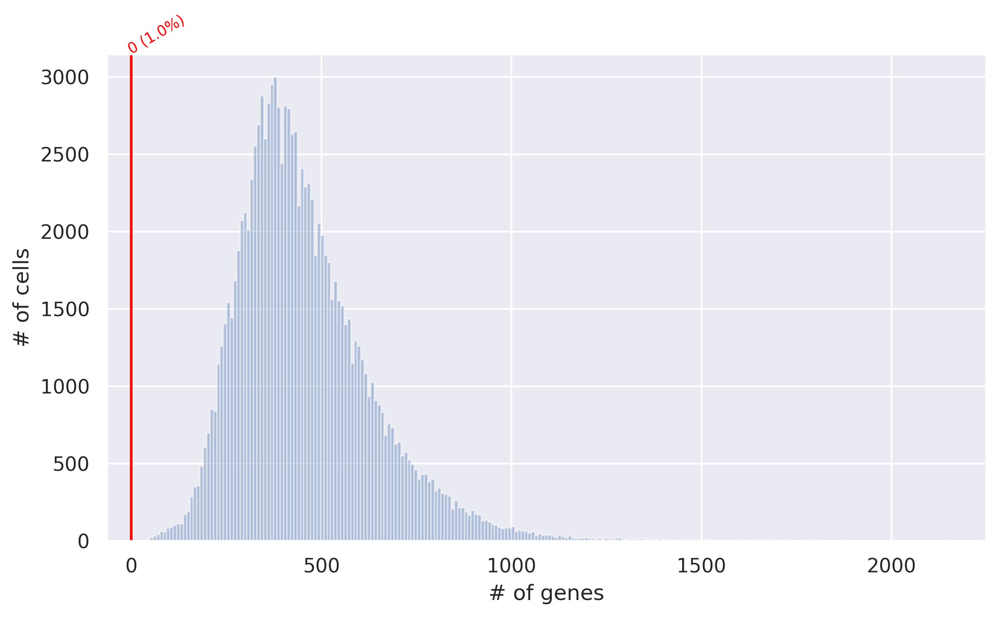

In [360]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i,x in enumerate(percentiles):
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({percentiles.index.values[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

In [402]:
!pyscenic aucell \
    {f_loom_path_scenic} \
    reg.csv \
    --auc_threshold 0.05 \
    --output {f_pyscenic_output} \
    --num_workers 20

/home/bobby/anaconda3/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}

2021-09-07 22:19:07,613 - pyscenic.cli.pyscenic - INFO - Loading expression matrix.

2021-09-07 22:19:13,521 - pyscenic.cli.pyscenic - INFO - Loading gene signatures.
Create regulons from a dataframe of enriched features.
Additional columns saved: []

2021-09-07 22:20:17,223 - pyscenic.cli.pyscenic - INFO - Calculating cellular enrichment.

2021-09-07 22:21:04,765 - pyscenic.cli.pyscenic - INFO - Writing results to file.


# Visualization of SCENIC's AUC matrix
First, load the relevant data from the loom we just created

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
import json
import zlib
import base64

# collect SCENIC AUCell output
lf = lp.connect( './write/cellranger3_SCENIC_output.loom', mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.MotifRegulonsAUC, index=lf.ca.CellID)
lf.close()

In [448]:
auc_mtx

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
AGAGTGGAGAACTGTA-5478STDY7980348,0.040397,0.040202,0.005602,0.008033,0.032711,0.000000,0.378532,0.065357,0.000000,0.000000,...,0.038794,0.000000,0.002646,0.000000,0.034282,0.019415,0.215781,0.065115,0.0,0.013288
CCTTTCTCAGATTGCT-5478STDY7980348,0.091126,0.011544,0.026395,0.004623,0.023960,0.002721,0.482102,0.051849,0.028446,0.000000,...,0.034708,0.000000,0.011463,0.020416,0.000000,0.021478,0.056750,0.056092,0.0,0.013297
GAAATGACAGCAGTTT-FCAImmP7536759,0.050452,0.059056,0.000000,0.003825,0.024753,0.035689,0.293514,0.050302,0.003441,0.000000,...,0.044918,0.081448,0.013506,0.000000,0.055475,0.016591,0.148944,0.059282,0.0,0.020432
TTCTCAAAGCCAGTAG-5478STDY7935102,0.000000,0.152048,0.000000,0.012066,0.023881,0.022521,0.261639,0.065091,0.014164,0.000000,...,0.038828,0.056561,0.014000,0.000000,0.102896,0.022977,0.237557,0.066684,0.0,0.015305
GACTGCGAGCGACGTA-WSSS_THYst8796441,0.040146,0.103666,0.000000,0.020275,0.007384,0.000000,0.662343,0.046695,0.031910,0.000000,...,0.093517,0.028658,0.034458,0.017992,0.043715,0.015625,0.263575,0.044563,0.0,0.062199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CACCAGGCAATCTGCA-WSSS_THYst9384954,0.042308,0.032138,0.002963,0.011345,0.014855,0.013774,0.517245,0.031517,0.000000,0.000000,...,0.056343,0.000000,0.038228,0.000000,0.038359,0.040670,0.110954,0.092835,0.0,0.021958
ACTGAACCAAGACACG-WSSS_THYst8796442,0.029387,0.000000,0.000000,0.017772,0.038312,0.017656,0.431373,0.047346,0.015083,0.000000,...,0.047246,0.000000,0.054381,0.000000,0.053928,0.025630,0.182504,0.082495,0.0,0.012824
GGCTCGAAGTTGAGAT-WSSS_THYst8796442,0.028708,0.000000,0.000000,0.014077,0.048509,0.009730,0.514580,0.050260,0.000000,0.000000,...,0.052050,0.000000,0.025847,0.035499,0.050950,0.036458,0.115385,0.093151,0.0,0.010751
AAACGGGCAGTATCTG-5386STDY7557336,0.027476,0.133716,0.000431,0.000000,0.023803,0.042742,0.441629,0.028194,0.017652,0.017949,...,0.084798,0.111520,0.049774,0.000000,0.057098,0.023742,0.000000,0.075213,0.0,0.019291


In [18]:
auc_mtx.columns = [x.split('_')[0] for x in auc_mtx.columns]

##### ---
# Regulon specificity scores (RSS) across predicted cell types for LPM

In [19]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

In [20]:
adata_lpm = sc.read_h5ad('../write/221024LimbCellranger3annotated_filtered_adjusted_scale_regress_scale_hvg_bbknn_lpm_lineage_20221124.h5ad')

In [21]:
adata_lpm

AnnData object with n_obs × n_vars = 102324 × 3401
    obs: 'batch', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'pre-annotation', 'region', 'tissue', 'adj_stage', 'adj_sample', 'leiden', 'S_score', 'G2M_score', 'phase', 'leiden_R', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltype', 'new_celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variableWSSS_THYst8796437', 'highly_variableWSSS_THYst8796442', 'highly_variable5478STDY7935101', 'highly_variable5478STDY7935102', 'highly_variableWSSS_THYst8796439', 'highly_variableWSSS_THYst9384956', 'highly_variable5478STDY7717491', 'highly_variableWSSS_THYst9384953', 'highly_variable5478STDY7717492', 'highly_variableWSSS_THYst9384955', 'highly_variable5386STDY7537944', 'highly_variableWSSS_THYst9384954', 'highly_variableFCAImmP7536759', 'highly_variable5478STDY7980349', 'highly_variableWSSS_THYst8796438', 'highly_variable5478STDY7652318', 'highly_variableWSSS_THYst8796441', 

In [24]:
auc_mtx_lpm = auc_mtx.loc[auc_mtx.index.isin(adata_lpm.obs_names),]

In [25]:
auc_mtx_lpm

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
AGAGTGGAGAACTGTA-5478STDY7980348,0.040397,0.040202,0.005602,0.008033,0.032711,0.000000,0.378532,0.065357,0.000000,0.000000,...,0.038794,0.000000,0.002646,0.000000,0.034282,0.019415,0.215781,0.065115,0.0,0.013288
CCTTTCTCAGATTGCT-5478STDY7980348,0.091126,0.011544,0.026395,0.004623,0.023960,0.002721,0.482102,0.051849,0.028446,0.000000,...,0.034708,0.000000,0.011463,0.020416,0.000000,0.021478,0.056750,0.056092,0.0,0.013297
GAAATGACAGCAGTTT-FCAImmP7536759,0.050452,0.059056,0.000000,0.003825,0.024753,0.035689,0.293514,0.050302,0.003441,0.000000,...,0.044918,0.081448,0.013506,0.000000,0.055475,0.016591,0.148944,0.059282,0.0,0.020432
TTCTCAAAGCCAGTAG-5478STDY7935102,0.000000,0.152048,0.000000,0.012066,0.023881,0.022521,0.261639,0.065091,0.014164,0.000000,...,0.038828,0.056561,0.014000,0.000000,0.102896,0.022977,0.237557,0.066684,0.0,0.015305
GACTGCGAGCGACGTA-WSSS_THYst8796441,0.040146,0.103666,0.000000,0.020275,0.007384,0.000000,0.662343,0.046695,0.031910,0.000000,...,0.093517,0.028658,0.034458,0.017992,0.043715,0.015625,0.263575,0.044563,0.0,0.062199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGAAGTCACACTGCG-WSSS_THYst8796442,0.020714,0.018216,0.000000,0.003760,0.000369,0.000000,0.790598,0.021255,0.070536,0.206938,...,0.075511,0.000000,0.018730,0.025641,0.022011,0.024533,0.227281,0.027320,0.0,0.060796
GCACTCTCAGCCTATA-WSSS_THYst8796439,0.042760,0.172236,0.000000,0.004711,0.015963,0.000000,0.444444,0.039704,0.001720,0.000000,...,0.054254,0.000000,0.004511,0.047350,0.044035,0.028579,0.316742,0.037644,0.0,0.027396
TGCTACCGTGATGATA-WSSS_THYst9384953,0.038964,0.109061,0.028927,0.008984,0.008084,0.009641,0.604525,0.045686,0.004713,0.000000,...,0.046081,0.000000,0.032017,0.043094,0.031265,0.034910,0.224548,0.056144,0.0,0.019045
CCTCTGAAGTGGTCCC-WSSS_THYst9384956,0.015485,0.030688,0.000000,0.007563,0.002184,0.004066,0.456360,0.042087,0.056373,0.000000,...,0.032019,0.016968,0.023598,0.032051,0.051141,0.039096,0.504808,0.039060,0.0,0.020386


In [26]:
adata_lpm_auc = adata_lpm[adata_lpm.obs_names.isin(auc_mtx_lpm.index),]

In [27]:
adata_lpm_auc

View of AnnData object with n_obs × n_vars = 6578 × 3401
    obs: 'batch', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'pre-annotation', 'region', 'tissue', 'adj_stage', 'adj_sample', 'leiden', 'S_score', 'G2M_score', 'phase', 'leiden_R', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltype', 'new_celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variableWSSS_THYst8796437', 'highly_variableWSSS_THYst8796442', 'highly_variable5478STDY7935101', 'highly_variable5478STDY7935102', 'highly_variableWSSS_THYst8796439', 'highly_variableWSSS_THYst9384956', 'highly_variable5478STDY7717491', 'highly_variableWSSS_THYst9384953', 'highly_variable5478STDY7717492', 'highly_variableWSSS_THYst9384955', 'highly_variable5386STDY7537944', 'highly_variableWSSS_THYst9384954', 'highly_variableFCAImmP7536759', 'highly_variable5478STDY7980349', 'highly_variableWSSS_THYst8796438', 'highly_variable5478STDY7652318', 'highly_variableWSSS_THYst8796

In [455]:
adata_all = sc.read_h5ad('../write/221024LimbCellranger3annotated_filtered_adjusted_scale_regress_scale_hvg_bbknn_20221115.h5ad')

In [456]:
adata_all_auc = adata_all[adata_all.obs_names.isin(auc_mtx.index),]

/home/bobby/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_utils.py:288: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/home/bobby/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_utils.py:288: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/home/bobby/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


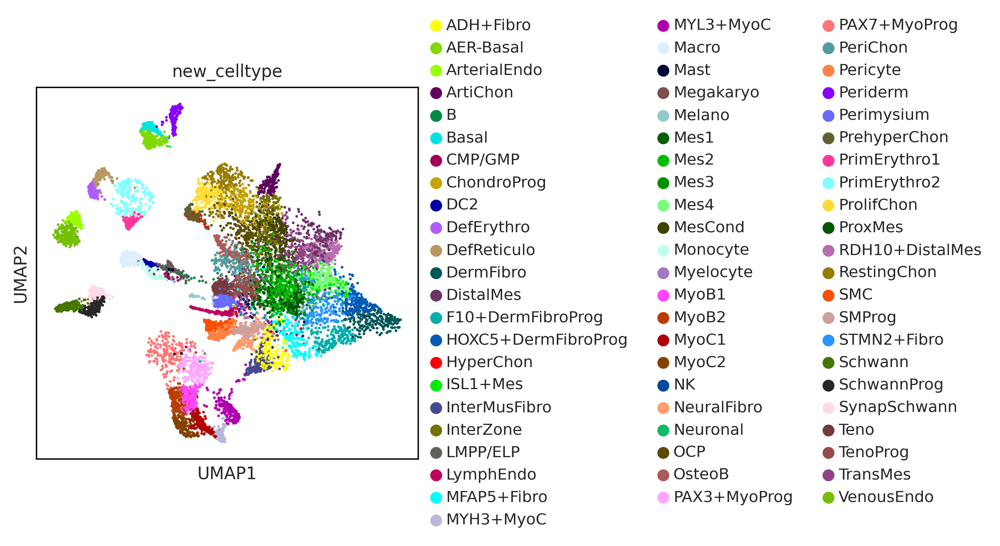

In [459]:
sc.pl.umap(adata_all_auc,color=['new_celltype'],
          save='adata_all_auc_celltype_20221219.pdf')

/home/bobby/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_utils.py:288: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/home/bobby/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


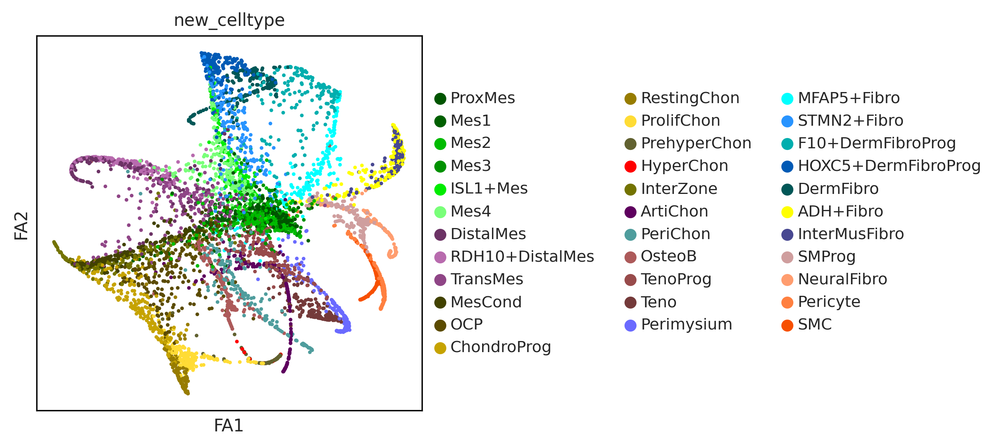

In [460]:
sc.pl.draw_graph(adata_lpm_auc,color=['new_celltype'],
                save='adata_lpm_auc_celltype_20221219.pdf')

In [30]:
auc_mtx_lpm = auc_mtx_lpm.reindex(index=adata_lpm_auc.obs_names)

In [44]:
set(auc_mtx_lpm.index==adata_lpm_auc.obs_names)

{True}

In [45]:
auc_mtx_lpm['new_celltype'] = adata_lpm_auc.obs['new_celltype']
auc_mtx_lpm_group_CT = auc_mtx_lpm.groupby(by='new_celltype').mean()

In [46]:
auc_mtx_lpm_group_CT

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
new_celltype,,,,,,,,,,,,,,,,,,,,,
ProxMes,0.046296,0.085408,0.006073,0.008857,0.018871,0.008416,0.471619,0.039243,0.012669,0.027246,...,0.045237,0.012570,0.021956,0.018663,0.027900,0.026418,0.274195,0.039888,0.001366,0.019158
Mes1,0.032137,0.074029,0.006767,0.009157,0.019506,0.007802,0.446241,0.042101,0.018908,0.026704,...,0.048877,0.013732,0.017420,0.012506,0.024670,0.021511,0.270843,0.036984,0.003658,0.020624
Mes2,0.039352,0.097391,0.005736,0.010359,0.016120,0.007146,0.478467,0.040607,0.026274,0.026648,...,0.046418,0.013048,0.022211,0.014968,0.021108,0.028913,0.308886,0.045139,0.002953,0.020040
Mes3,0.030642,0.065138,0.006721,0.008614,0.017659,0.007145,0.447482,0.041741,0.032543,0.025135,...,0.046780,0.011353,0.024563,0.014886,0.018078,0.025179,0.335653,0.040441,0.002344,0.018804
ISL1+Mes,0.044597,0.084892,0.009480,0.007735,0.013483,0.006816,0.477406,0.036647,0.017493,0.027914,...,0.049528,0.010476,0.020707,0.013334,0.027756,0.023171,0.247081,0.034571,0.004104,0.023302
Mes4,0.029522,0.075057,0.006694,0.007842,0.017034,0.006740,0.518033,0.037528,0.036265,0.024123,...,0.051727,0.013965,0.019938,0.020316,0.020544,0.025490,0.307640,0.035812,0.003294,0.023101
DistalMes,0.024903,0.123913,0.004567,0.008852,0.014040,0.004114,0.642945,0.035861,0.058111,0.030121,...,0.074211,0.008997,0.012994,0.025742,0.028020,0.026406,0.302500,0.036825,0.001493,0.040816
RDH10+DistalMes,0.035682,0.086058,0.005322,0.009159,0.018687,0.005961,0.496083,0.041660,0.097028,0.020390,...,0.048840,0.011965,0.017732,0.024858,0.028153,0.029249,0.339287,0.038627,0.003429,0.022472
TransMes,0.024042,0.096659,0.004992,0.009171,0.015842,0.006746,0.544507,0.038092,0.030892,0.027280,...,0.053860,0.011832,0.017858,0.022147,0.022358,0.027266,0.318885,0.037138,0.003737,0.029655


In [106]:
auc_mtx_lpm_group_CT_Z = pd.DataFrame( index=auc_mtx_lpm_group_CT.index )
for col in list(auc_mtx_lpm_group_CT.columns):
    auc_mtx_lpm_group_CT_Z[col] = ( auc_mtx_lpm_group_CT[col] - auc_mtx_lpm_group_CT[col].mean()) / auc_mtx_lpm_group_CT[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until


In [32]:
rss_cellType = regulon_specificity_scores(auc_mtx_lpm, adata_lpm_auc.obs['new_celltype'])
rss_cellType

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
TransMes,0.198851,0.215285,0.190011,0.200867,0.187769,0.200255,0.216832,0.195031,0.217470,0.201284,...,0.211591,0.196093,0.200647,0.217886,0.193188,0.211259,0.216596,0.197827,0.181017,0.217277
ISL1+Mes,0.220662,0.210718,0.208858,0.195325,0.185024,0.200667,0.211938,0.194262,0.198720,0.200088,...,0.208636,0.192727,0.204942,0.197380,0.197953,0.205914,0.207318,0.196103,0.185097,0.208844
Mes1,0.207755,0.205760,0.198573,0.199883,0.191541,0.204683,0.209562,0.197331,0.200489,0.199651,...,0.208193,0.201258,0.199648,0.196932,0.195449,0.203681,0.210360,0.197731,0.180309,0.205214
OCP,0.217372,0.206960,0.195135,0.206083,0.212392,0.196801,0.210538,0.219924,0.203526,0.197279,...,0.208424,0.197091,0.202798,0.205750,0.196583,0.207828,0.219410,0.211050,0.181296,0.206197
ProxMes,0.222295,0.210952,0.194879,0.199533,0.191229,0.206614,0.211529,0.195804,0.190386,0.199293,...,0.205752,0.197209,0.207021,0.209491,0.198528,0.210004,0.211067,0.199604,0.173814,0.202714
Mes4,0.204981,0.205909,0.197443,0.196742,0.189300,0.200758,0.214952,0.194773,0.224811,0.198397,...,0.209954,0.200200,0.204067,0.214309,0.191366,0.209020,0.215399,0.196969,0.178701,0.208513
RDH10+DistalMes,0.211384,0.211360,0.193091,0.200319,0.191084,0.197339,0.213396,0.197244,0.294779,0.192199,...,0.208222,0.196279,0.200350,0.223222,0.198723,0.213906,0.219308,0.198851,0.180000,0.207831
STMN2+Fibro,0.213568,0.211208,0.185064,0.197587,0.187087,0.198122,0.210647,0.196837,0.212334,0.200158,...,0.206076,0.193169,0.213931,0.197702,0.197364,0.210183,0.213148,0.199713,0.179537,0.201847
DistalMes,0.199700,0.226136,0.189177,0.199555,0.185851,0.189174,0.223943,0.193706,0.252192,0.205952,...,0.224283,0.189674,0.192725,0.224966,0.199076,0.210132,0.214829,0.197588,0.172841,0.232126
OsteoB,0.220253,0.203792,0.189535,0.260246,0.207055,0.192214,0.210961,0.210909,0.197653,0.198438,...,0.210015,0.189195,0.201117,0.224520,0.198021,0.205393,0.209541,0.207851,0.176640,0.206185


### RSS panel plot with all cell types

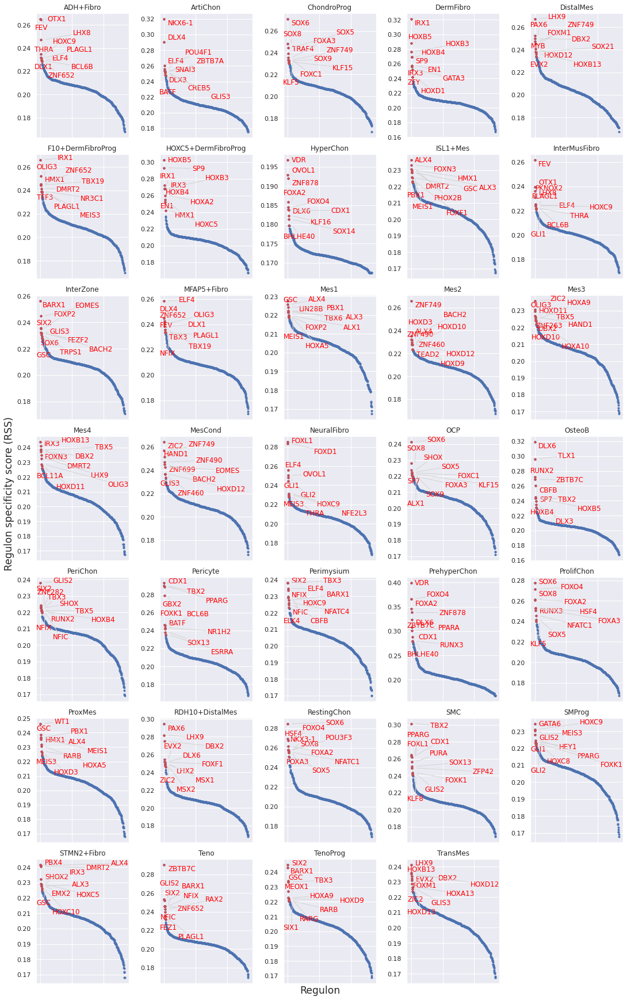

In [447]:
 cats = sorted(list(set(adata_lpm.obs['new_celltype'].cat.categories)))

fig = plt.figure(figsize=(15, 24))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_cellType.T[c]
    ax = fig.add_subplot(7,5,num)
    plot_rss(rss_cellType, c, top_n=10, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("adata_lpm_cellType-RSS-top10.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [56]:
auc_mtx_lpm_group_CT.index

CategoricalIndex(['ProxMes', 'Mes1', 'Mes2', 'Mes3', 'ISL1+Mes', 'Mes4',
                  'DistalMes', 'RDH10+DistalMes', 'TransMes', 'MesCond', 'OCP',
                  'ChondroProg', 'RestingChon', 'ProlifChon', 'PrehyperChon',
                  'HyperChon', 'InterZone', 'ArtiChon', 'PeriChon', 'OsteoB',
                  'TenoProg', 'Teno', 'Perimysium', 'MFAP5+Fibro',
                  'STMN2+Fibro', 'F10+DermFibroProg', 'HOXC5+DermFibroProg',
                  'DermFibro', 'ADH+Fibro', 'InterMusFibro', 'SMProg',
                  'NeuralFibro', 'Pericyte', 'SMC'],
                 categories=['ProxMes', 'Mes1', 'Mes2', 'Mes3', 'ISL1+Mes', 'Mes4', 'DistalMes', 'RDH10+DistalMes', ...], ordered=True, dtype='category', name='new_celltype')

In [301]:
auc_mtx_lpm_group_CT_Mes_bone_Tendon = auc_mtx_lpm_group_CT.loc[auc_mtx_lpm_group_CT.index.isin(['ProxMes', 'Mes1', 'Mes2', 'Mes3',
                  'DistalMes', 'RDH10+DistalMes', 'TransMes', 'MesCond', 'OCP',
                  'ChondroProg', 'RestingChon', 'ProlifChon', 'PrehyperChon',
                  'HyperChon', 'InterZone', 'ArtiChon', 'PeriChon', 'OsteoB',
                  'TenoProg', 'Teno', 'Perimysium']),]

In [302]:
auc_mtx_lpm_group_CT_Mes_bone_Tendon

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
new_celltype,,,,,,,,,,,,,,,,,,,,,
ProxMes,0.046296,0.085408,0.006073,0.008857,0.018871,0.008416,0.471619,0.039243,0.012669,0.027246,...,0.045237,0.012570,0.021956,0.018663,0.027900,0.026418,0.274195,0.039888,0.001366,0.019158
Mes1,0.032137,0.074029,0.006767,0.009157,0.019506,0.007802,0.446241,0.042101,0.018908,0.026704,...,0.048877,0.013732,0.017420,0.012506,0.024670,0.021511,0.270843,0.036984,0.003658,0.020624
Mes2,0.039352,0.097391,0.005736,0.010359,0.016120,0.007146,0.478467,0.040607,0.026274,0.026648,...,0.046418,0.013048,0.022211,0.014968,0.021108,0.028913,0.308886,0.045139,0.002953,0.020040
Mes3,0.030642,0.065138,0.006721,0.008614,0.017659,0.007145,0.447482,0.041741,0.032543,0.025135,...,0.046780,0.011353,0.024563,0.014886,0.018078,0.025179,0.335653,0.040441,0.002344,0.018804
DistalMes,0.024903,0.123913,0.004567,0.008852,0.014040,0.004114,0.642945,0.035861,0.058111,0.030121,...,0.074211,0.008997,0.012994,0.025742,0.028020,0.026406,0.302500,0.036825,0.001493,0.040816
RDH10+DistalMes,0.035682,0.086058,0.005322,0.009159,0.018687,0.005961,0.496083,0.041660,0.097028,0.020390,...,0.048840,0.011965,0.017732,0.024858,0.028153,0.029249,0.339287,0.038627,0.003429,0.022472
TransMes,0.024042,0.096659,0.004992,0.009171,0.015842,0.006746,0.544507,0.038092,0.030892,0.027280,...,0.053860,0.011832,0.017858,0.022147,0.022358,0.027266,0.318885,0.037138,0.003737,0.029655
MesCond,0.028707,0.087360,0.007211,0.012507,0.025814,0.007144,0.438870,0.055771,0.037089,0.023731,...,0.040790,0.016981,0.020881,0.020741,0.012975,0.032091,0.359925,0.046931,0.005438,0.018124
OCP,0.041127,0.076928,0.006115,0.011122,0.040655,0.005829,0.459987,0.084699,0.020919,0.024355,...,0.049298,0.012190,0.019072,0.016621,0.025982,0.024634,0.342506,0.058262,0.003167,0.021334


In [303]:
Mes_bone_tendon_topreg_dict = dict()
Mes_bone_tendon_topreg_list = []
for c in auc_mtx_lpm_group_CT_Mes_bone_Tendon.index:
    Mes_bone_tendon_topreg_dict[c]=list(auc_mtx_lpm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index)
    Mes_bone_tendon_topreg_list.extend(list(auc_mtx_lpm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index))

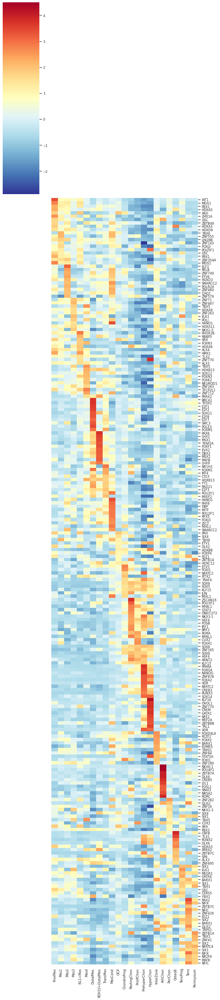

In [147]:
import seaborn as sns
sns.set(font_scale=0.75)
Mes_bone_tendon_g = sns.clustermap(auc_mtx_lpm_group_CT_Mes_bone_Tendon[Mes_bone_tendon_topreg_list].T, 
                   annot=False,  
                   square=False,  
                   linecolor='gray',
                   row_cluster=False,
                  #method='average',
                   #metric='cosine',
                  col_cluster=False,
                  yticklabels=True, 
                   xticklabels=True, 
                   #vmin=-2, vmax=6, 
                   #col_colors=[colormap],
                   z_score=0,
                   #cmap="YlGnBu", 
                   cmap="RdYlBu_r", 
                   figsize=(8,36)
                  )
Mes_bone_tendon_g.cax.set_visible(True)
Mes_bone_tendon_g.ax_heatmap.set_ylabel('')
Mes_bone_tendon_g.ax_heatmap.set_xlabel('')
plt.savefig("./figures/heatmap_Scenic_TFs_top_Mes_Bone_Tendon_mean_activity_in_CT_20221216.pdf", dpi=600, bbox_inches = "tight")

In [304]:
Mes_bone_tendon_topreg_dict

{'ProxMes': ['WT1',
  'MEIS1',
  'PBX1',
  'HOXA5',
  'ARX',
  'LMX1A',
  'GSC',
  'ZBTB49',
  'HOXA3',
  'HOXD9'],
 'Mes1': ['TBX6',
  'ZNF555',
  'LIN28B',
  'ZNF143',
  'FOXJ2',
  'POU5F1',
  'GSC',
  'PBX1',
  'ZNF354A',
  'MEIS1'],
 'Mes2': ['ELF2',
  'RELB',
  'ZNF749',
  'ETV6',
  'HOXD3',
  'SMARCC2',
  'POLR2A',
  'ZNF460',
  'CHD2',
  'ZNF579'],
 'Mes3': ['ZNF71',
  'ZNF467',
  'TBX5',
  'HOXA9',
  'ZNF263',
  'ELK1',
  'POLI',
  'HAND1',
  'HOXA11',
  'NKX2-3'],
 'DistalMes': ['BRCA1',
  'TFDP1',
  'E2F1',
  'E2F2',
  'SOX21',
  'E2F8',
  'E2F7',
  'SMC3',
  'POLE3',
  'FOXM1'],
 'RDH10+DistalMes': ['PAX6',
  'LHX2',
  'MSX1',
  'TFAP2A',
  'FOXF1',
  'EVX2',
  'DBX2',
  'MSX2',
  'MAFB',
  'LHX9'],
 'TransMes': ['NR1H3',
  'FOXM1',
  'IRF4',
  'CTCF',
  'HOXB13',
  'YY1',
  'RAD21',
  'E2F3',
  'POU2F1',
  'MYEF2'],
 'MesCond': ['HAND1',
  'PHF8',
  'DBP',
  'MITF',
  'POU2F1',
  'RFX5',
  'FOXJ3',
  'ZIC2',
  'MIXL1',
  'SMARCC2'],
 'OCP': ['ARX',
  'SIX4',
  'TBX6',
  'ET

In [413]:
topreg = ['WT1','GATA6','MEIS1','PBX1',
          'ZNF555','TBX6','FOXJ2',
          'ELF2','RELB','ETV6',
          'ZNF467','ZNF71','HOXA11',
          'BRCA1','TFDP1','SMC3',
          'LHX9','PAX6','LHX2','TFAP2A','MSX2',
          'NR1H3','MYEF2',
          'HAND1','DBP','FOXJ3','EOMES',
          'ARX','SIX4',
          'ETV5','FOXI1','PITX2','SOX6','SOX9','SOX5',
          'ZSCAN16','POU3F3','ONECUT3','RORA',
          'CUX2','FOXA1',
          'PPARA','NANOG','FOXO4','RUNX3','SP7',
          'MEF2A','OVOL1','ZBTB8B','KLF16','ZNF770',
          'FOXP2','FOXD4L6','TRPS1','GLI1',
           'NKX6-1','POU4F1','DLX4','RORC','NR3C1',
          'ZNF282','NKX2-3',
          'CBFB','TLX1','RUNX2','DLX6',
          'ELK1','GATA4','SIX2','SIX1', 
          'ZNF426','NFIX','NFIC',
          'NFATC4','ZNF41','ZBTB14'
         ]

In [414]:
len(set(topreg))

76

In [415]:
topreg_df = pd.DataFrame(topreg)

In [416]:
topreg_df.drop_duplicates()[0]

0        WT1
1      GATA6
2      MEIS1
3       PBX1
4     ZNF555
       ...  
71      NFIX
72      NFIC
73    NFATC4
74     ZNF41
75    ZBTB14
Name: 0, Length: 76, dtype: object

In [417]:
topreg_uniq = list(topreg_df.drop_duplicates()[0])

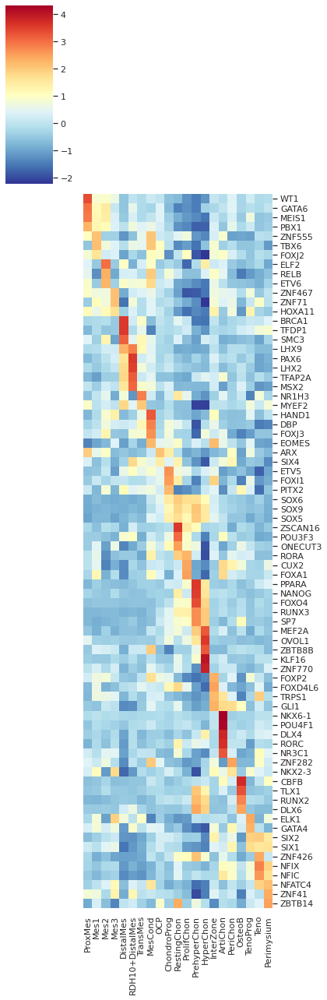

In [420]:
import seaborn as sns
sns.set(font_scale=1)
Mes_bone_tendon_g = sns.clustermap(auc_mtx_lpm_group_CT_Mes_bone_Tendon[topreg_uniq].T, 
                   annot=False,  
                   square=False,  
                   linecolor='gray',
                   row_cluster=False,
                  #method='average',
                   #metric='cosine',
                  col_cluster=False,
                  yticklabels=True, 
                   xticklabels=True, 
                   #vmin=-2, vmax=6, 
                   #col_colors=[colormap],
                   z_score=0,
                   #cmap="YlGnBu", 
                   cmap="RdYlBu_r", 
                   figsize=(6,18)
                  )
Mes_bone_tendon_g.cax.set_visible(True)
Mes_bone_tendon_g.ax_heatmap.set_ylabel('')
Mes_bone_tendon_g.ax_heatmap.set_xlabel('')
plt.savefig("./figures/heatmap_Scenic_TFs_top_Mes_Bone_Tendon_mean_activity_in_CT_20221216.pdf", 
            dpi=600, bbox_inches = "tight")

/home/bobby/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/home/bobby/anaconda3/lib/python3.7/site-packages/scanpy/plotting/_utils.py:288: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
/home/bobby/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


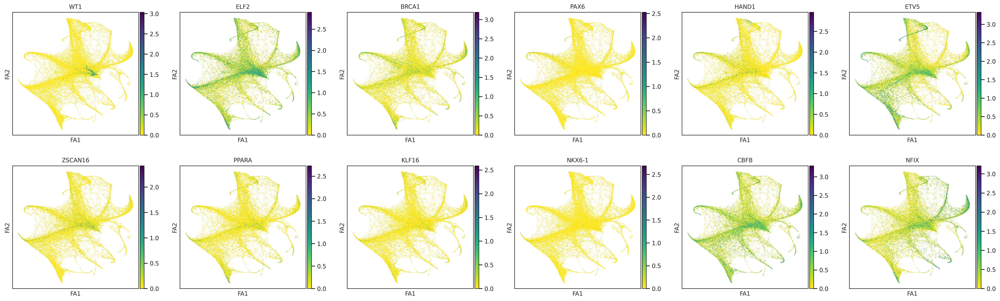

In [468]:
sc.pl.draw_graph(adata_lpm,color=['WT1','ELF2','BRCA1','PAX6','HAND1','ETV5','ZSCAN16',
                                 'PPARA','KLF16','NKX6-1','CBFB','NFIX'],cmap='viridis_r',ncols=6,
                save='adata_lpm_TF_top1_genes_20221219.pdf')

In [ ]:
###### auc_mtx_lpm_group_CT_FiB = auc_mtx_lpm_group_CT.loc[auc_mtx_lpm_group_CT.index.isin(['Mes4','ISL1+Mes', 
                  'MFAP5+Fibro',
                  'STMN2+Fibro', 'F10+DermFibroProg', 'HOXC5+DermFibroProg',
                  'DermFibro', 'ADH+Fibro', 'InterMusFibro', 'SMProg',
                  'NeuralFibro', 'Pericyte', 'SMC']),]

In [328]:
auc_mtx_lpm_group_CT_FiB = auc_mtx_lpm_group_CT_FiB.reindex(index=['Mes4','ISL1+Mes', 
                  'MFAP5+Fibro','F10+DermFibroProg',
                  'STMN2+Fibro','HOXC5+DermFibroProg',
                  'DermFibro', 'ADH+Fibro', 'InterMusFibro', 'SMProg',
                  'NeuralFibro', 'Pericyte', 'SMC'])

In [321]:
auc_mtx_lpm_group_CT_FiB.loc['STMN2+Fibro',].sort_values()

NFATC2     0.000079
ZBTB7C     0.000329
HMX2       0.000519
STAT5A     0.000636
FOXD4L4    0.000793
             ...   
HMGB3      0.381214
HMGA1      0.420601
SOX4       0.439190
HMGA2      0.455231
HMGB1      0.459496
Name: STMN2+Fibro, Length: 535, dtype: float64

In [326]:
auc_mtx_lpm_group_CT_Z.T['STMN2+Fibro'].sort_values(ascending=False).head(20)

PBX4       3.411118
ALX4       2.197689
DMRT2      2.111333
HOXC5      2.040436
BDP1       1.827066
ARID5B     1.826877
ZNF354A    1.809079
HOXA7      1.803974
HOXA2      1.760527
TWIST1     1.760377
FOXF2      1.749241
SHOX2      1.727279
TFCP2L1    1.714997
HOXA10     1.710767
ALX3       1.687907
MEIS1      1.668019
EMX2       1.659078
HOXC10     1.657022
LIN28B     1.642372
HOXA5      1.540671
Name: STMN2+Fibro, dtype: float64

In [330]:
FiB_topreg_dict = dict()
FiB_topreg_list = []
for c in auc_mtx_lpm_group_CT_FiB.index:
    FiB_topreg_dict[c]=list(auc_mtx_lpm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index)
    FiB_topreg_list.extend(list(auc_mtx_lpm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index))

In [314]:
FiB_topreg_dict

{'Mes4': ['TBX5',
  'HOXB13',
  'SOX12',
  'FOXN3',
  'FOXK2',
  'NEUROD1',
  'ZNF263',
  'TFCP2L1',
  'ZNF112',
  'PRRX2'],
 'ISL1+Mes': ['PHOX2B',
  'RBBP5',
  'ARX',
  'FOXN3',
  'HOXA6',
  'ALX4',
  'HMX1',
  'TLX2',
  'ZNF770',
  'ALX3'],
 'MFAP5+Fibro': ['ETV2',
  'DLX1',
  'ELF4',
  'ZNF354A',
  'TBX19',
  'POU3F2',
  'PAX3',
  'ZNF652',
  'THRA',
  'OLIG3'],
 'STMN2+Fibro': ['PBX4',
  'ALX4',
  'DMRT2',
  'HOXC5',
  'BDP1',
  'ARID5B',
  'ZNF354A',
  'HOXA7',
  'HOXA2',
  'TWIST1'],
 'F10+DermFibroProg': ['ZNF91',
  'TFF3',
  'TBX19',
  'ZNF831',
  'NR3C1',
  'FOXQ1',
  'TBX15',
  'OLIG3',
  'NFE2L1',
  'KLF11'],
 'HOXC5+DermFibroProg': ['GBX1',
  'HOXA2',
  'SP9',
  'HOXB5',
  'HOXC5',
  'AR',
  'IRX3',
  'HOXB3',
  'HOXB4',
  'HMX1'],
 'DermFibro': ['IRX1',
  'ZFY',
  'HOXB3',
  'GATA3',
  'SOX1',
  'HOXC13',
  'ATF6',
  'HOXA1',
  'HOXB4',
  'HOXB5'],
 'ADH+Fibro': ['OTX1',
  'FEV',
  'LHX8',
  'TCF7L2',
  'LHX4',
  'ZNF429',
  'TFEB',
  'THRA',
  'RARA',
  'HIC1'],
 'InterM

Text(0.5, -109.54, '')

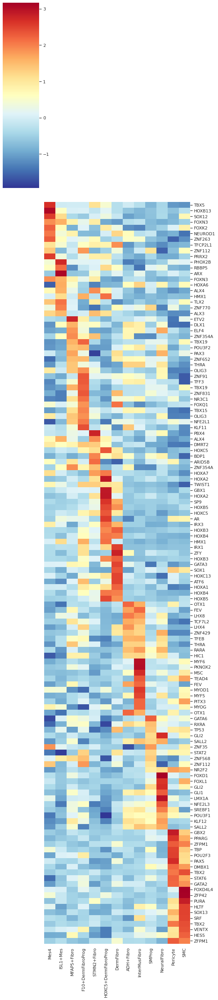

In [331]:
import seaborn as sns
sns.set(font_scale=1)
FiB_g = sns.clustermap(auc_mtx_lpm_group_CT_FiB[FiB_topreg_list].T, 
                   annot=False,  
                   square=False,  
                   linecolor='gray',
                   row_cluster=False,
                  #method='average',
                   #metric='cosine',
                  col_cluster=False,
                  yticklabels=True, 
                   xticklabels=True, 
                   #vmin=-2, vmax=6, 
                   #col_colors=[colormap],
                   z_score=0,
                   #cmap="YlGnBu", 
                   cmap="RdYlBu_r", 
                   figsize=(8,36)
                  )
FiB_g.cax.set_visible(True)
FiB_g.ax_heatmap.set_ylabel('')
FiB_g.ax_heatmap.set_xlabel('')
#plt.savefig("./figures/heatmap_Scenic_TFs_top_Mes_Bone_Tendon_mean_activity_in_CT_20221216.pdf", dpi=600, bbox_inches = "tight")

In [332]:
FiB_topreg_dict

{'Mes4': ['TBX5',
  'HOXB13',
  'SOX12',
  'FOXN3',
  'FOXK2',
  'NEUROD1',
  'ZNF263',
  'TFCP2L1',
  'ZNF112',
  'PRRX2'],
 'ISL1+Mes': ['PHOX2B',
  'RBBP5',
  'ARX',
  'FOXN3',
  'HOXA6',
  'ALX4',
  'HMX1',
  'TLX2',
  'ZNF770',
  'ALX3'],
 'MFAP5+Fibro': ['ETV2',
  'DLX1',
  'ELF4',
  'ZNF354A',
  'TBX19',
  'POU3F2',
  'PAX3',
  'ZNF652',
  'THRA',
  'OLIG3'],
 'F10+DermFibroProg': ['ZNF91',
  'TFF3',
  'TBX19',
  'ZNF831',
  'NR3C1',
  'FOXQ1',
  'TBX15',
  'OLIG3',
  'NFE2L1',
  'KLF11'],
 'STMN2+Fibro': ['PBX4',
  'ALX4',
  'DMRT2',
  'HOXC5',
  'BDP1',
  'ARID5B',
  'ZNF354A',
  'HOXA7',
  'HOXA2',
  'TWIST1'],
 'HOXC5+DermFibroProg': ['GBX1',
  'HOXA2',
  'SP9',
  'HOXB5',
  'HOXC5',
  'AR',
  'IRX3',
  'HOXB3',
  'HOXB4',
  'HMX1'],
 'DermFibro': ['IRX1',
  'ZFY',
  'HOXB3',
  'GATA3',
  'SOX1',
  'HOXC13',
  'ATF6',
  'HOXA1',
  'HOXB4',
  'HOXB5'],
 'ADH+Fibro': ['OTX1',
  'FEV',
  'LHX8',
  'TCF7L2',
  'LHX4',
  'ZNF429',
  'TFEB',
  'THRA',
  'RARA',
  'HIC1'],
 'InterM

In [333]:
topreg =['HOXB13','TBX5','PRRX2','SOX12','ZNF263',
        'ARX','PHOX2B','RBBP5','TLX2','ZNF770',
        'DLX1','ZNF354A','ETV2','ELF4','TBX19',
        'NR3C1','ZNF91','TFF3','ZNF831','KLF11',
        'DMRT2','PBX4','ALX4','ARID5B','BDP1',
        'HOXA7','HOXC5','HOXA2','AR','SP9','HOXB5',
         'HOXB5','HOXB3','HOXB4','HOXA1','IRX1','ZFY','GATA3',
        'OTX1','LHX4','LHX8','RARA','FEV',
        'MYF6','PKNOX2','MSC','MYOD1','MYF5',
        'GATA6','ZNF35','RXRA','GLI2',
        'FOXD1','LMX1A','FOXL1','GLI1','NFE2L3',
        'GBX2','PAX5','PPARG','TBP','DMBX1',
        'TBX2','SOX13','HLTF','PURA','ZFP42','FOXD4L4']

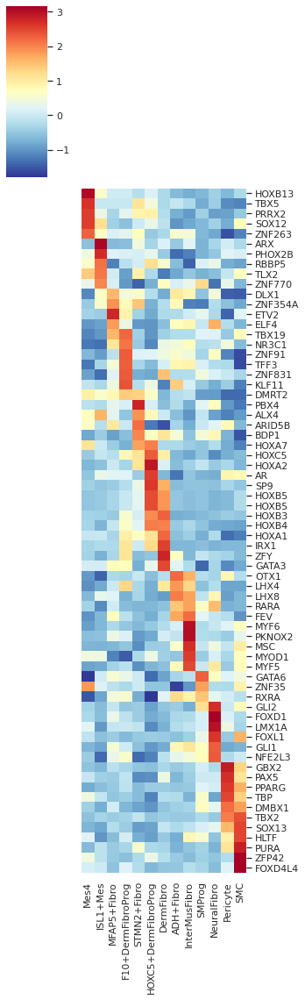

In [339]:
import seaborn as sns
sns.set(font_scale=1)
FiB_g = sns.clustermap(auc_mtx_lpm_group_CT_FiB[topreg].T, 
                   annot=False,  
                   square=False,  
                   linecolor='gray',
                   row_cluster=False,
                  #method='average',
                   #metric='cosine',
                  col_cluster=False,
                  yticklabels=True, 
                   xticklabels=True, 
                   #vmin=-2, vmax=6, 
                   #col_colors=[colormap],
                   z_score=0,
                   #cmap="YlGnBu", 
                   cmap="RdYlBu_r", 
                   figsize=(5,16)
                  )
FiB_g.cax.set_visible(True)
FiB_g.ax_heatmap.set_ylabel('')
FiB_g.ax_heatmap.set_xlabel('')
plt.savefig("./figures/heatmap_Scenic_TFs_top_FiB_mean_activity_in_CT_20221219.pdf", 
            dpi=600, bbox_inches = "tight")

## TFs for skeletal muscle

In [340]:
adata_skm = sc.read_h5ad('../write/221024LimbCellranger3annotated_filtered_adjusted_scale_regress_scale_hvg_bbknn_skm_f_lineage_20221118.h5ad')

In [342]:
adata_skm

AnnData object with n_obs × n_vars = 12376 × 3401
    obs: 'batch', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'pre-annotation', 'region', 'tissue', 'adj_stage', 'adj_sample', 'leiden', 'S_score', 'G2M_score', 'phase', 'leiden_R', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltype', 'new_celltype', 'leiden_R_celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variableWSSS_THYst8796437', 'highly_variableWSSS_THYst8796442', 'highly_variable5478STDY7935101', 'highly_variable5478STDY7935102', 'highly_variableWSSS_THYst8796439', 'highly_variableWSSS_THYst9384956', 'highly_variable5478STDY7717491', 'highly_variableWSSS_THYst9384953', 'highly_variable5478STDY7717492', 'highly_variableWSSS_THYst9384955', 'highly_variable5386STDY7537944', 'highly_variableWSSS_THYst9384954', 'highly_variableFCAImmP7536759', 'highly_variable5478STDY7980349', 'highly_variableWSSS_THYst8796438', 'highly_variable5478STDY7652318', 'highly_variable

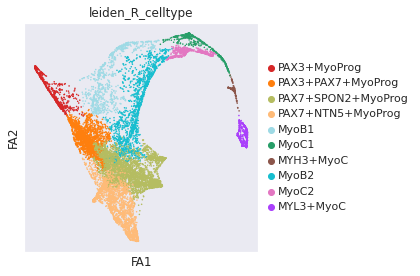

In [343]:
sc.pl.draw_graph(adata_skm,color='leiden_R_celltype')

In [344]:
auc_mtx_skm = auc_mtx.loc[auc_mtx.index.isin(adata_skm.obs_names),]

In [345]:
auc_mtx_skm

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
CACCACTCACATCCAA-5478STDY7652318,0.049221,0.091832,0.000000,0.008624,0.011689,0.002898,0.257667,0.020162,0.002781,0.000000,...,0.041650,0.000000,0.062183,0.000000,0.000000,0.029050,0.000000,0.035701,0.000000,0.038752
CGCCAAGTCCGCGGTA-5478STDY7717492,0.062469,0.096995,0.000000,0.002011,0.009309,0.000000,0.428909,0.022360,0.002121,0.000000,...,0.035305,0.000000,0.072618,0.000000,0.002493,0.031179,0.052508,0.027645,0.000000,0.055859
CATGACACACCTGGTG-WSSS_THYst8796442,0.059226,0.052326,0.000000,0.000710,0.020260,0.002625,0.517848,0.038913,0.001225,0.123831,...,0.040035,0.000000,0.110202,0.000000,0.009472,0.052228,0.090875,0.053339,0.000000,0.067262
CCTAGCTAGACAGGCT-WSSS_THYst9384954,0.057466,0.085973,0.000000,0.000000,0.013669,0.000000,0.417195,0.046237,0.004878,0.139970,...,0.037827,0.000283,0.094707,0.000000,0.015300,0.053289,0.128865,0.041413,0.042421,0.066459
TCTGAGACATTGGGCC-WSSS_THYst8796437,0.056109,0.076923,0.000000,0.007334,0.041101,0.000000,0.399196,0.034634,0.000000,0.000000,...,0.045731,0.000000,0.046401,0.000000,0.013051,0.033947,0.151678,0.047459,0.000000,0.048679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CGTCACTCATAAGACA-5478STDY7935102,0.000000,0.132962,0.015568,0.009203,0.005939,0.000000,0.354148,0.045334,0.000000,0.000000,...,0.046510,0.000000,0.051652,0.003771,0.000000,0.021013,0.106900,0.052746,0.061275,0.020253
ACGGGCTCAATAACGA-5478STDY7935101,0.000000,0.085451,0.032482,0.005071,0.001351,0.022787,0.379085,0.036949,0.000000,0.055354,...,0.046955,0.000000,0.032374,0.000000,0.014546,0.024537,0.000000,0.041979,0.181373,0.021875
CTCGGGATCTGGCGTG-FCAImmP7536758,0.003670,0.055923,0.000000,0.002929,0.001367,0.009190,0.662846,0.026595,0.000000,0.000000,...,0.098976,0.000000,0.005334,0.000000,0.005560,0.030865,0.000000,0.039042,0.000000,0.068932
AACCGCGGTAGCTCCG-5478STDY7935101,0.000000,0.056213,0.000000,0.017018,0.032334,0.013523,0.444193,0.031323,0.022130,0.000000,...,0.049292,0.091723,0.046894,0.000000,0.038819,0.021000,0.066648,0.046260,0.032051,0.017047


In [346]:
adata_skm_auc = adata_skm[adata_skm.obs_names.isin(auc_mtx_skm.index),]

In [347]:
adata_skm_auc

View of AnnData object with n_obs × n_vars = 1484 × 3401
    obs: 'batch', 'percent_mito', 'n_counts', 'n_genes', 'doublet_scores', 'bh_pval', 'pre-annotation', 'region', 'tissue', 'adj_stage', 'adj_sample', 'leiden', 'S_score', 'G2M_score', 'phase', 'leiden_R', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'celltype', 'new_celltype', 'leiden_R_celltype'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variableWSSS_THYst8796437', 'highly_variableWSSS_THYst8796442', 'highly_variable5478STDY7935101', 'highly_variable5478STDY7935102', 'highly_variableWSSS_THYst8796439', 'highly_variableWSSS_THYst9384956', 'highly_variable5478STDY7717491', 'highly_variableWSSS_THYst9384953', 'highly_variable5478STDY7717492', 'highly_variableWSSS_THYst9384955', 'highly_variable5386STDY7537944', 'highly_variableWSSS_THYst9384954', 'highly_variableFCAImmP7536759', 'highly_variable5478STDY7980349', 'highly_variableWSSS_THYst8796438', 'highly_variable5478STDY7652318', 'highly_v

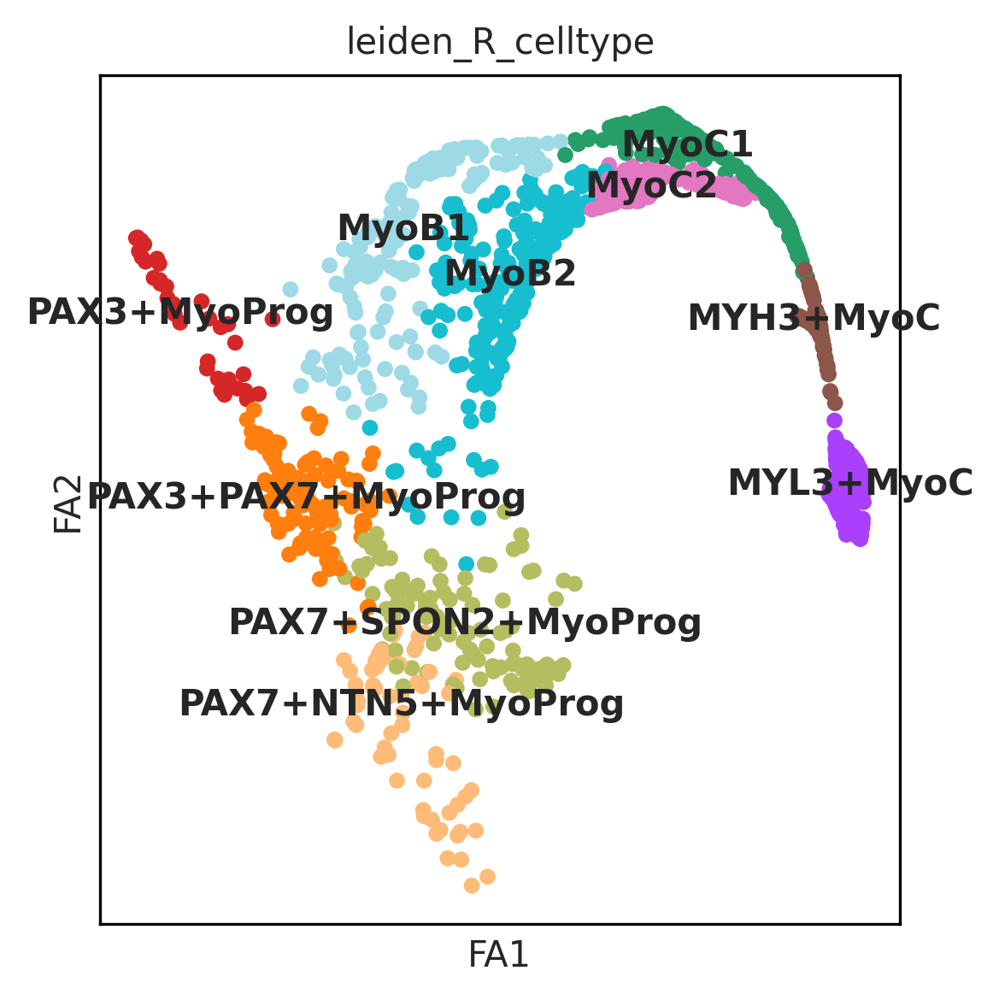

In [465]:
sc.pl.draw_graph(adata_skm_auc,color=['leiden_R_celltype'],legend_loc='on data',
                save='adata_skm_auc_celltype_20221219.pdf')

In [348]:
set(adata_skm_auc.obs_names==auc_mtx_skm.index)

{False}

In [349]:
auc_mtx_skm = auc_mtx_skm.reindex(index=adata_skm_auc.obs_names)

In [351]:
auc_mtx_skm

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
ACATCAGAGGTAAACT-5386STDY7537944,0.007893,0.049020,0.000000,0.060572,0.010951,0.018558,0.362092,0.021689,0.000000,0.000000,...,0.043088,0.000000,0.063403,0.000000,0.009881,0.037962,0.258390,0.027156,0.0,0.019713
ACGAGGAGTCTACCTC-5386STDY7537944,0.038939,0.078895,0.000000,0.008613,0.023504,0.000000,0.395475,0.031561,0.000000,0.213424,...,0.044061,0.000000,0.020033,0.009050,0.034103,0.024236,0.147719,0.027069,0.0,0.021500
AGATTGCCAAGTTGTC-5386STDY7537944,0.026018,0.085219,0.002909,0.000000,0.016253,0.003645,0.414429,0.034657,0.000000,0.000000,...,0.040516,0.005845,0.063732,0.000000,0.023264,0.028003,0.215498,0.028440,0.0,0.023317
AGGGATGGTACTTGAC-5386STDY7537944,0.012569,0.068511,0.000000,0.031969,0.021462,0.002026,0.402966,0.036522,0.020221,0.140422,...,0.041452,0.013763,0.009776,0.034852,0.009126,0.025479,0.238499,0.036504,0.0,0.020037
AGTTGGTAGAGCTGGT-5386STDY7537944,0.000000,0.024133,0.000000,0.018143,0.017070,0.000000,0.414731,0.028319,0.022719,0.049321,...,0.052232,0.082673,0.023625,0.000000,0.024248,0.025187,0.110860,0.030842,0.0,0.017954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TATTACCGTTTGTTGG-WSSS_THYst9384958,0.071745,0.088989,0.000000,0.000000,0.008233,0.002322,0.462645,0.028658,0.031886,0.000000,...,0.036011,0.000000,0.010339,0.035337,0.021781,0.038779,0.238971,0.041787,0.0,0.016813
TCACGAATCTTCCTTC-WSSS_THYst9384958,0.056461,0.009514,0.014275,0.006908,0.023638,0.006240,0.403670,0.044819,0.020975,0.000000,...,0.035554,0.012349,0.083368,0.000000,0.000000,0.058415,0.199284,0.051062,0.0,0.050711
TCGTACCCACAAGCCC-WSSS_THYst9384958,0.032278,0.022508,0.000000,0.030865,0.000746,0.004636,0.554198,0.028589,0.000000,0.000000,...,0.034369,0.000000,0.043631,0.000000,0.000000,0.042709,0.182221,0.038498,0.0,0.030661
TTCTTAGTCAGCTCTC-WSSS_THYst9384958,0.091905,0.023031,0.000000,0.000000,0.017565,0.001560,0.379437,0.050691,0.016285,0.000000,...,0.029381,0.000000,0.131660,0.007003,0.009063,0.067674,0.181938,0.057080,0.0,0.064424


In [352]:
rss_skm_cellType = regulon_specificity_scores(auc_mtx_skm, adata_skm_auc.obs['leiden_R_celltype'])
rss_skm_cellType

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
PAX3+PAX7+MyoProg,0.220715,0.278948,0.206680,0.237577,0.231880,0.222053,0.272553,0.246473,0.240678,0.234359,...,0.277709,0.203401,0.201534,0.230596,0.275822,0.238542,0.276292,0.245479,0.175896,0.248351
MyoB1,0.287055,0.297523,0.209203,0.244907,0.268461,0.232691,0.300874,0.283693,0.250121,0.255347,...,0.289735,0.211227,0.242708,0.238465,0.286732,0.275340,0.319540,0.276043,0.179739,0.256321
PAX3+MyoProg,0.185539,0.215432,0.186526,0.209275,0.191728,0.191691,0.211079,0.196696,0.210516,0.204307,...,0.212125,0.192078,0.181508,0.220604,0.214301,0.197531,0.220650,0.197596,0.180038,0.197756
MyoC1,0.349464,0.290693,0.229642,0.287004,0.326001,0.289498,0.318179,0.319612,0.266003,0.250934,...,0.296743,0.233614,0.380801,0.220061,0.242580,0.341785,0.320311,0.324138,0.201316,0.330797
MyoB2,0.326280,0.339849,0.268974,0.301140,0.295849,0.288636,0.340563,0.332770,0.271817,0.262127,...,0.349972,0.258051,0.293441,0.283341,0.328896,0.314495,0.302644,0.330231,0.176605,0.306620
PAX7+SPON2+MyoProg,0.227085,0.265864,0.227958,0.248797,0.242444,0.254776,0.255266,0.266223,0.256845,0.223275,...,0.260925,0.214762,0.207317,0.238483,0.272552,0.243936,0.255117,0.262448,0.282214,0.228137
MyoC2,0.309596,0.280871,0.237073,0.247538,0.274419,0.287384,0.288998,0.292070,0.215076,0.240555,...,0.282716,0.258851,0.308598,0.208479,0.235400,0.289607,0.267387,0.291430,0.179713,0.260736
PAX7+NTN5+MyoProg,0.210781,0.235470,0.199984,0.212530,0.216894,0.218309,0.231696,0.231538,0.221181,0.217748,...,0.241884,0.191172,0.191317,0.215961,0.230851,0.217816,0.227945,0.226954,0.237954,0.231215
MYL3+MyoC,0.194668,0.187754,0.225707,0.292990,0.241082,0.227340,0.220918,0.253418,0.212046,0.237278,...,0.248896,0.229189,0.261637,0.313315,0.287751,0.251476,0.185639,0.256399,0.198137,0.290065
MYH3+MyoC,0.297399,0.245799,0.239245,0.269175,0.322472,0.284872,0.273396,0.290970,0.265009,0.262392,...,0.256231,0.230656,0.368989,0.199417,0.257625,0.332402,0.274472,0.306245,0.179295,0.343872


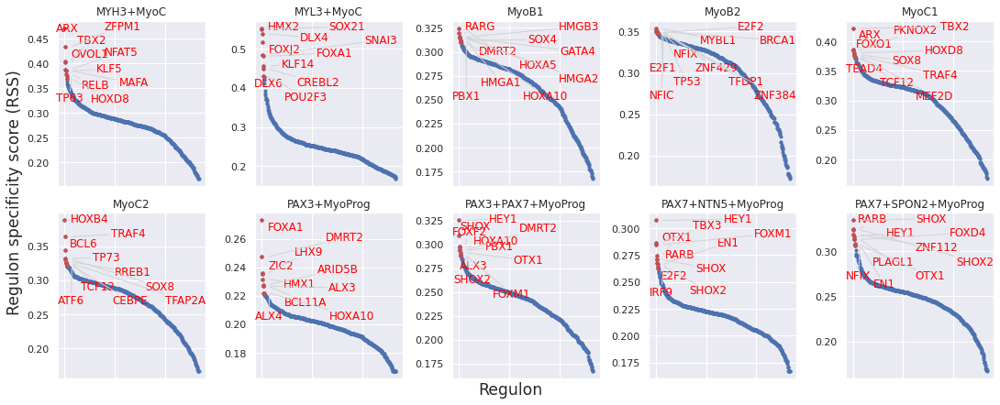

In [354]:
cats = sorted(list(set(adata_skm_auc.obs['leiden_R_celltype'].cat.categories)))

fig = plt.figure(figsize=(15, 6))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss_skm_cellType.T[c]
    ax = fig.add_subplot(2,5,num)
    plot_rss(rss_skm_cellType, c, top_n=10, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.savefig("adata_skm_cellType-RSS-top10.pdf", dpi=600, bbox_inches = "tight")
plt.show()

In [355]:
auc_mtx_skm['leiden_R_celltype'] = adata_skm_auc.obs['leiden_R_celltype']
auc_mtx_skm_group_CT = auc_mtx_skm.groupby(by='leiden_R_celltype').mean()

In [356]:
auc_mtx_skm_group_CT

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
leiden_R_celltype,,,,,,,,,,,,,,,,,,,,,
PAX3+MyoProg,0.014779,0.107677,0.004772,0.010502,0.008706,0.003894,0.570444,0.027570,0.009315,0.041311,...,0.063553,0.011243,0.016147,0.017985,0.025031,0.024509,0.200292,0.030562,0.003975,0.029778
PAX3+PAX7+MyoProg,0.019319,0.109592,0.004757,0.007440,0.010489,0.003716,0.584374,0.032012,0.007268,0.035116,...,0.067559,0.006593,0.015896,0.009616,0.024740,0.024124,0.174865,0.033672,0.001683,0.034929
PAX7+SPON2+MyoProg,0.021324,0.092812,0.007900,0.008792,0.012307,0.006529,0.460163,0.042287,0.008813,0.029122,...,0.053894,0.008890,0.018947,0.012499,0.024307,0.026290,0.133681,0.043080,0.023241,0.023668
PAX7+NTN5+MyoProg,0.025079,0.102387,0.005512,0.007280,0.013039,0.005595,0.548696,0.043108,0.007878,0.041720,...,0.071473,0.005806,0.017829,0.011624,0.022042,0.027320,0.145227,0.041982,0.024300,0.045190
MyoB1,0.032834,0.088860,0.003547,0.005953,0.012127,0.003548,0.523307,0.034858,0.005757,0.035797,...,0.050805,0.006269,0.027545,0.008384,0.019289,0.027210,0.174511,0.033970,0.001442,0.025510
MyoC1,0.039691,0.060801,0.004350,0.007118,0.014342,0.004948,0.426485,0.034433,0.005193,0.026527,...,0.037551,0.007595,0.072512,0.004415,0.008428,0.035377,0.127008,0.038038,0.004135,0.038698
MYH3+MyoC,0.039460,0.051029,0.007014,0.008706,0.020257,0.006684,0.404141,0.039323,0.007036,0.037401,...,0.034539,0.009132,0.100243,0.003556,0.013855,0.049442,0.120895,0.048727,0.001384,0.063377
MyoB2,0.031646,0.083452,0.007493,0.008000,0.011302,0.004994,0.470971,0.035102,0.005848,0.028622,...,0.054817,0.010944,0.033934,0.009869,0.018732,0.025671,0.105153,0.036564,0.000897,0.029504
MyoC2,0.038336,0.069869,0.006084,0.005708,0.011874,0.006159,0.425107,0.034937,0.002891,0.027712,...,0.042675,0.013234,0.055564,0.004219,0.009514,0.029214,0.099604,0.036977,0.001962,0.024484


In [357]:
auc_mtx_skm_group_CT_Z = pd.DataFrame( index=auc_mtx_skm_group_CT.index )
for col in list(auc_mtx_skm_group_CT.columns):
    auc_mtx_skm_group_CT_Z[col] = ( auc_mtx_skm_group_CT[col] - auc_mtx_skm_group_CT[col].mean()) / auc_mtx_skm_group_CT[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

/home/bobby/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until


In [358]:
auc_mtx_skm_group_CT_Z

,DLX2,SMC3,ZNF770,CBFB,FOXA2,HES5,HMGB1,FOXA3,PAX6,ACAA1,...,TFDP1,ZNF16,HOXD8,ZNF695,PPARG,NFIL3,RARG,KLF2,POU4F1,E2F8
leiden_R_celltype,,,,,,,,,,,,,,,,,,,,,
PAX3+MyoProg,-1.178174,1.049076,-0.773776,1.269664,-1.304580,-0.972675,1.039258,-1.618678,1.509443,1.379996,...,0.965262,0.716536,-0.903294,1.548312,1.040356,-0.661879,1.477480,-1.353105,-0.347445,-0.538240
PAX3+PAX7+MyoProg,-0.743474,1.117031,-0.784339,-0.383879,-0.698599,-1.129370,1.172974,-0.691805,0.438136,0.215224,...,1.284169,-1.019870,-0.912647,-0.094956,0.991208,-0.714121,0.940287,-0.759497,-0.614896,-0.110103
PAX7+SPON2+MyoProg,-0.551582,0.521578,1.353738,0.345917,-0.080770,1.341645,-0.019359,1.452206,1.246730,-0.911756,...,0.196361,-0.162227,-0.799240,0.471156,0.917981,-0.420276,0.070239,1.036173,1.901354,-1.046174
PAX7+NTN5+MyoProg,-0.192061,0.861362,-0.270977,-0.470291,0.168093,0.521241,0.830495,1.623640,0.757279,1.456886,...,1.595742,-1.313756,-0.840766,0.299456,0.534951,-0.280620,0.314165,0.826507,2.025054,0.742839
MyoB1,0.550316,0.381328,-1.607267,-1.186984,-0.141836,-1.276792,0.586773,-0.097807,-0.352508,0.343168,...,-0.049509,-1.140737,-0.479627,-0.336870,0.069533,-0.295497,0.932817,-0.702629,-0.643000,-0.893015
MyoC1,1.206789,-0.614424,-1.060898,-0.557715,0.611098,-0.047403,-0.342646,-0.186493,-0.647478,-1.399745,...,-1.104544,-0.645625,1.191826,-1.116088,-1.767010,0.812041,-0.070734,0.073770,-0.328756,0.203184
MYH3+MyoC,1.184654,-0.961194,0.751213,0.299548,2.622089,1.477951,-0.557132,0.833726,0.316829,0.644847,...,-1.344271,-0.071883,2.222631,-1.284867,-0.849436,2.719659,-0.199890,2.113942,-0.649852,2.254662
MyoB2,0.436634,0.189383,1.076881,-0.081410,-0.422234,-0.006365,0.084389,-0.046901,-0.304859,-1.005779,...,0.269907,0.604846,-0.242136,-0.045157,-0.024716,-0.504335,-0.532451,-0.207602,-0.706675,-0.561045
MyoC2,1.077068,-0.292611,0.118235,-1.318997,-0.227706,1.016886,-0.355880,-0.081333,-1.851665,-1.176820,...,-0.696615,1.459942,0.561867,-1.154673,-1.583450,-0.023805,-0.649682,-0.128689,-0.582333,-0.978288


In [360]:
auc_mtx_skm_group_CT.index

CategoricalIndex(['PAX3+MyoProg', 'PAX3+PAX7+MyoProg', 'PAX7+SPON2+MyoProg',
                  'PAX7+NTN5+MyoProg', 'MyoB1', 'MyoC1', 'MYH3+MyoC', 'MyoB2',
                  'MyoC2', 'MYL3+MyoC'],
                 categories=['PAX3+MyoProg', 'PAX3+PAX7+MyoProg', 'PAX7+SPON2+MyoProg', 'PAX7+NTN5+MyoProg', 'MyoB1', 'MyoC1', 'MYH3+MyoC', 'MyoB2', ...], ordered=True, dtype='category', name='leiden_R_celltype')

In [361]:
auc_mtx_skm_group_CT_Z.T[c]

DLX2     -1.178174
SMC3      1.049076
ZNF770   -0.773776
CBFB      1.269664
FOXA2    -1.304580
            ...   
NFIL3    -0.661879
RARG      1.477480
KLF2     -1.353105
POU4F1   -0.347445
E2F8     -0.538240
Name: PAX3+MyoProg, Length: 535, dtype: float64

In [362]:
skm_topreg_dict = dict()
skm_topreg_list = []
for c in auc_mtx_skm_group_CT.index:
    skm_topreg_dict[c]=list(auc_mtx_skm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index)
    skm_topreg_list.extend(list(auc_mtx_skm_group_CT_Z.T[c].sort_values(ascending=False)[:10].index))

In [363]:
skm_topreg_dict

{'PAX3+MyoProg': ['LHX9',
  'TFCP2L1',
  'FOXJ1',
  'BCL11A',
  'ZNF580',
  'GBX1',
  'ZIC2',
  'DMRT2',
  'POLI',
  'ARID5B'],
 'PAX3+PAX7+MyoProg': ['FOXI1',
  'GMEB2',
  'TBX5',
  'POLE3',
  'POLE4',
  'HMGA1',
  'ZNF143',
  'FOXF2',
  'MEIS3',
  'POU3F3'],
 'PAX7+SPON2+MyoProg': ['ZNF112',
  'ZNF699',
  'ZNF426',
  'GLIS3',
  'ZFY',
  'FOXD4',
  'ERG',
  'POU6F1',
  'CREB3L1',
  'ELF4'],
 'PAX7+NTN5+MyoProg': ['LMX1A',
  'NKX6-1',
  'E2F7',
  'FOXM1',
  'E2F2',
  'TBX3',
  'NR1H3',
  'DBP',
  'LHX8',
  'MYEF2'],
 'MyoB1': ['ZNF354A',
  'LIN28B',
  'FOXL1',
  'GATA4',
  'NANOG',
  'ONECUT3',
  'HOXA5',
  'HOXB6',
  'TBX6',
  'GMEB1'],
 'MyoC1': ['HOXA6',
  'RARA',
  'ZNF263',
  'NFYC',
  'MSC',
  'SOX8',
  'TCF12',
  'MIXL1',
  'E2F5',
  'RUNX2'],
 'MYH3+MyoC': ['HLTF',
  'OVOL1',
  'ZFPM1',
  'FOXD4L4',
  'MAFG',
  'GBX2',
  'NFAT5',
  'NFIL3',
  'HOXC5',
  'RELB'],
 'MyoB2': ['HAND1',
  'LHX4',
  'ZNF121',
  'POU6F1',
  'LHX8',
  'RFX1',
  'NKX3-1',
  'SOX14',
  'SOX30',
  'PURA']

Text(0.5, -111.7900000000001, '')

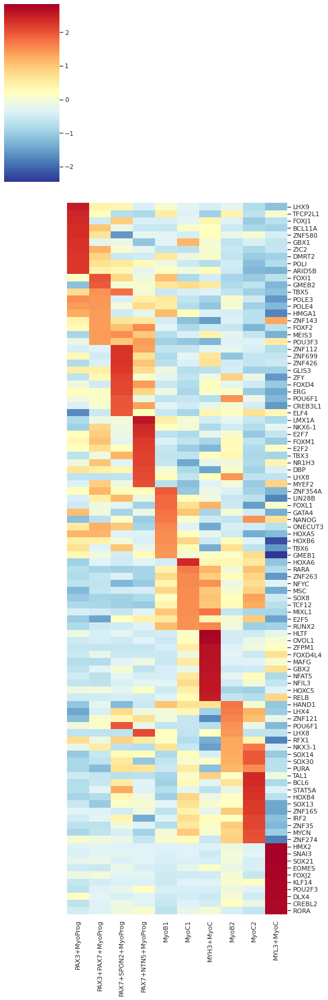

In [365]:
import seaborn as sns
sns.set(font_scale=1)
skm_g = sns.clustermap(auc_mtx_skm_group_CT[skm_topreg_list].T, 
                   annot=False,  
                   square=False,  
                   linecolor='gray',
                   row_cluster=False,
                  #method='average',
                   #metric='cosine',
                  col_cluster=False,
                  yticklabels=True, 
                   xticklabels=True, 
                   #vmin=-2, vmax=6, 
                   #col_colors=[colormap],
                   z_score=0,
                   #cmap="YlGnBu", 
                   cmap="RdYlBu_r", 
                   figsize=(8,24)
                  )
skm_g.cax.set_visible(True)
skm_g.ax_heatmap.set_ylabel('')
skm_g.ax_heatmap.set_xlabel('')
#plt.savefig("./figures/heatmap_Scenic_TFs_top_Mes_Bone_Tendon_mean_activity_in_CT_20221216.pdf", dpi=600, bbox_inches = "tight")

In [382]:
auc_mtx_skm_group_CT_Z['PAX3']

leiden_R_celltype
PAX3+MyoProg          0.507928
PAX3+PAX7+MyoProg    -0.205248
PAX7+SPON2+MyoProg   -1.286637
PAX7+NTN5+MyoProg    -0.958650
MyoB1                 0.749304
MyoC1                 1.370735
MYH3+MyoC             1.761847
MyoB2                -0.431503
MyoC2                -0.394673
MYL3+MyoC            -1.113103
Name: PAX3, dtype: float64

In [378]:
auc_mtx_skm_group_CT_Z.loc['PAX3+MyoProg',].sort_values()

TBP       -1.970469
HOXB3     -1.864997
ELF4      -1.808178
RUNX3     -1.775473
TGIF1     -1.729599
             ...   
ZNF580     2.453067
BCL11A     2.453951
FOXJ1      2.515991
TFCP2L1    2.538468
LHX9       2.650973
Name: PAX3+MyoProg, Length: 535, dtype: float64

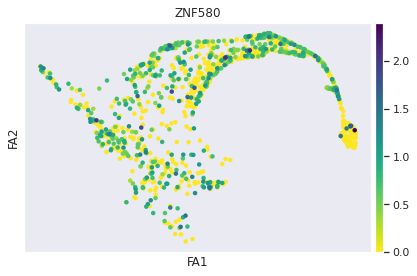

In [381]:
sc.pl.draw_graph(adata_skm_auc,color=['ZNF580'],cmap='viridis_r')